In [2]:
import  pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


import data and extraxt dependet and indepenedt variable

In [3]:
df=pd.read_csv("Salary_Data.csv")
x=df[['YearsExperience']].values
y=df['Salary'].values
df.head()

,YearsExperience,Salary
0,1.1,39343
1,1.3,46205
2,1.5,37731
3,2.0,43525
4,2.2,39891


visualize using differnet plots

C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


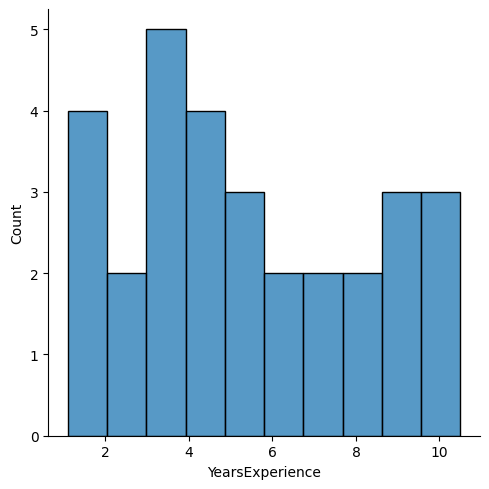

In [4]:
sns.displot(df['YearsExperience'],kde=False, bins=10)

C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Axes: xlabel='count', ylabel='YearsExperience'>

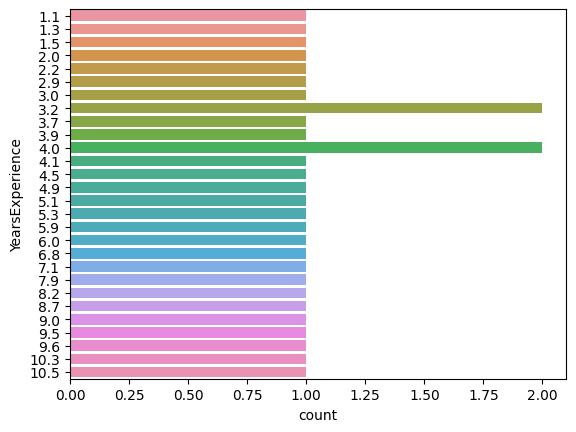

In [5]:
sns.countplot(y='YearsExperience',data=df)

C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Admin\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) 

<Axes: xlabel='YearsExperience', ylabel='Salary'>

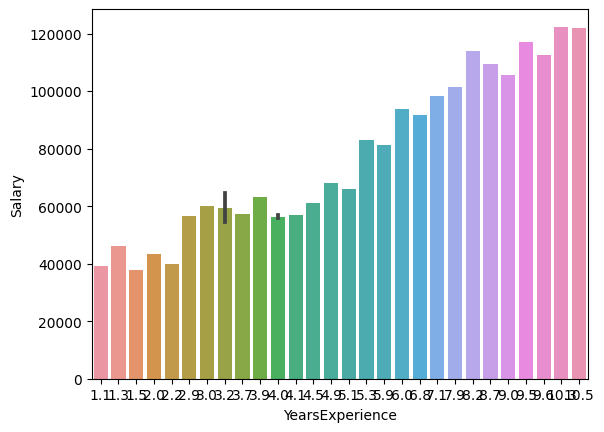

In [6]:
sns.barplot(x='YearsExperience',y="Salary",data=df)

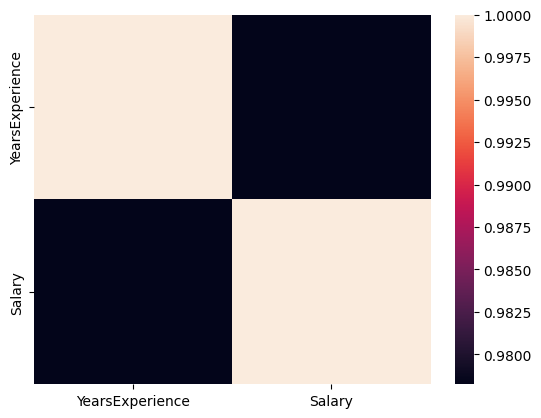

In [7]:
sns.heatmap(df.corr())
plt.show()

In [8]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=5,random_state=0)

In [9]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
lr.fit(x_train,y_train)
y_pred=lr.predict(x_test)
y_pred

array([ 40691.99663985, 122933.04133999,  64990.48711944,  63121.37246716,
       115456.58273088])

visualize the predcited value

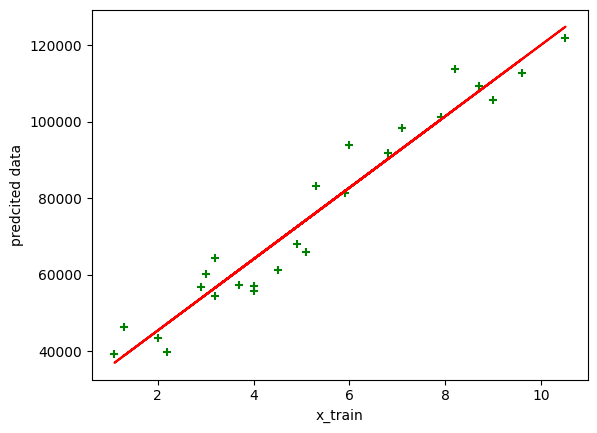

In [10]:
plt.scatter(x_train,y_train,marker='+',color='green')#available data point
plt.plot(x_train,lr.predict(x_train),color='red')
plt.xlabel("x_train")
plt.ylabel("predcited data")
plt.show()

visualize testing data

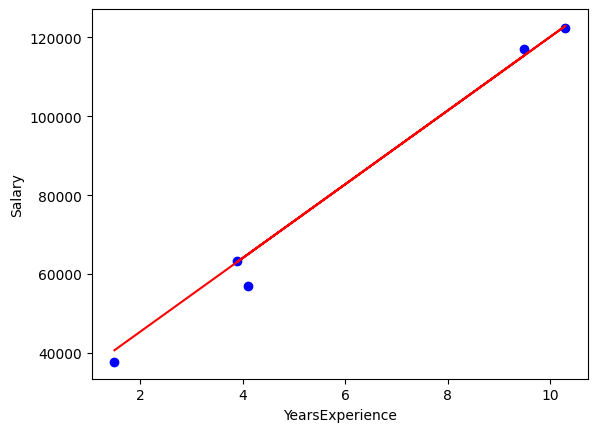

In [11]:
plt.scatter(x_test,y_test,color='blue')
plt.plot(x_test,y_pred,color='red')
plt.xlabel("YearsExperience")
plt.ylabel("Salary")
plt.show()

finding accuracy test

In [12]:
from sklearn import metrics
mae=metrics.mean_absolute_error(y_test,y_pred)
mse=metrics.mean_squared_error(y_test,y_pred)
print("mse=",mse)
print("mae=",mae)
print(lr.coef_)
print(lr.intercept_)



mse= 14783607.856811482
mae= 2604.313980246414
[9345.57326138]
26673.636747785356


use gradient decenet to minimize cost function and best the data 

In [13]:
import numpy as np

def gradient_decent(x,y):
    w_curr=b_curr=0      #start with some value zero 
    iteration=100000
    learning_rate=0.001
    for i in range(iteration):
        y_pred=w_curr*x+b_curr
        n=len(x)
        cost=(1/n)*sum([val**2 for val in (y-y_pred)])
        wd=-(2/n)*sum(x*(y-y_pred))
        bd=-(2/n)*sum(y-y_pred)
        w_curr=w_curr-learning_rate*wd
        b_curr=b_curr-learning_rate*bd
        print("w= {},    b= {},    cost= {},    iteraion {}".format(w_curr,b_curr,cost,i))

#normalize first it 
from sklearn.preprocessing import StandardScaler
scle=StandardScaler()
x_train_norm=scle.fit_transform(x_train)
x_train_1d=x_train_norm.flatten()
gradient_decent(x_train_1d,y_train)



w= 49.147352402607964,    b= 150.616,    cost= 6309958793.36,    iteraion 0
w= 98.19641010041067,    b= 300.93076800000006,    cost= 6284883252.297519,    iteraion 1
w= 147.1473696828178,    b= 450.94490646400004,    cost= 6259907913.09712,    iteraion 2
w= 196.00042734606012,    b= 600.6590166510721,    cost= 6235032375.352171,    iteraion 3
w= 244.75577889397596,    b= 750.07369861777,    cost= 6210256240.256047,    iteraion 4
w= 293.41361973879594,    b= 899.1895512205344,    cost= 6185579110.595769,    iteraion 5
w= 341.9741449019263,    b= 1048.0071721180934,    cost= 6161000590.745612,    iteraion 6
w= 390.4375490147304,    b= 1196.5271577738572,    cost= 6136520286.660778,    iteraion 7
w= 438.8040263193089,    b= 1344.7501034583095,    cost= 6112137805.871067,    iteraion 8
w= 487.07377066927825,    b= 1492.6766032513929,    cost= 6087852757.474588,    iteraion 9
w= 535.2469755305476,    b= 1640.30725004489,    cost= 6063664752.131505,    iteraion 10
w= 583.3238339820945,    b=

find parameter w and b which fit best to your model and replace the coef and intercept with GDA finding algorithm

In [14]:
lr.coef_=np.array([8978])
lr.intercept_=26345

now predict with new parameter value

In [15]:
exp=[[4.1]]
lr.predict(exp)

array([63154.8])

In [16]:
x_test

array([[ 1.5],
       [10.3],
       [ 4.1],
       [ 3.9],
       [ 9.5]])

save model to file than in future direct predict no need  to train again 

In [17]:
import pickle #save python object
with open("moedl_pickle","wb") as f:
    pickle.dump(lr,f) #dump save it to file and load agaun load to code

In [18]:
with open("moedl_pickle","rb") as f:
    mp=pickle.load(f)

In [19]:
mp.predict([[2.9]])

array([52381.2])

for large number of numpy array save using joblib of sklean

In [22]:
import joblib
joblib.dump(lr,"joblib_model")




['joblib_model']

In [24]:
model=joblib.load("joblib_model")
model.predict([[3]])

array([53279])